# Desafio Fadesp

<a target="_blank" href="https://colab.research.google.com/github/andrespp/fadesp/blob/master/fadesp_notebook.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

In [ ]:
!pip install -q condacolab
import condacolab
condacolab.install()

In [ ]:
!wget https://raw.githubusercontent.com/andrespp/fadesp/master/environment.yml

In [ ]:
!conda env update -f environment.yml

In [42]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import locale
import datetime as dt
import sqlite3
from ydata_profiling import ProfileReport

locale.setlocale(locale.LC_ALL, 'en_US.UTF-8')
pd.options.display.float_format = '{:.2f}'.format

DS_SRC = 'https://github.com/andrespp/fadesp/raw/master/data/dataset_desafio_fadesp.csv'
#DS_SRC = './data/dataset_desafio_fadesp.csv'

## Etapas Obrigatórias

### Extração dos dados

* A extração é realizada diretamente no URL do dataset conforme sugerido na descrição do desafio
* Alguns parâmetros relevantes da função `read_csv()` são explicitados, mesmo que em seus valores padrão, de forma a tornar o código mais legível e diminuir a chance de erros de parser comuns na leitura de CSVs (delimitadores de strings, encoding, separadores decimais, etc)

In [38]:
df = pd.read_csv(
    DS_SRC,
    sep=',',
    quotechar='"',
    decimal='.',
    thousands=None,
    encoding='latin1',
)

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51290 entries, 0 to 51289
Data columns (total 24 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Row ID          51290 non-null  int64  
 1   Order ID        51290 non-null  object 
 2   Order Date      51290 non-null  object 
 3   Ship Date       51290 non-null  object 
 4   Ship Mode       51290 non-null  object 
 5   Customer ID     51290 non-null  object 
 6   Customer Name   51290 non-null  object 
 7   Segment         51290 non-null  object 
 8   City            51290 non-null  object 
 9   State           51290 non-null  object 
 10  Country         51290 non-null  object 
 11  Postal Code     9994 non-null   float64
 12  Market          51290 non-null  object 
 13  Region          51290 non-null  object 
 14  Product ID      51290 non-null  object 
 15  Category        51290 non-null  object 
 16  Sub-Category    51290 non-null  object 
 17  Product Name    51290 non-null 

### Limpeza dos Dados

* Para realização desta etapa, inicia-se com uma etapa de data-profiling para melhor entendimento da estrura do *dataset*
* O relatório gerado nessa etapa também irá subsidiar análises subsequentes deste conjunto de dados

#### Profile Report

In [40]:
profile = ProfileReport(df, title="Profiling Report")

In [41]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Dados Nulos
* A partir da aba ***"Missing Values"***, observa-se que apenas a coluna *"Postal Code"* possui valores nulos.
* Considerando que o conjunto dispõe de outros atributos com a identificação geográfica das vendas, optou-se inicialmente por não realizar a substituição ou remoção de valores neste campo

#### Dados Duplicados

* Dada a natureza do conjunto, é possível existir pedidos com as mesmas características (cliente, itens, valores etc)
* Contudo, o *dataset* dispõe de chave primária (**Row ID**), a qual deve ser única, como forma de garantir que não hajam dados em duplicidade, que poderiam vir a introduzir erros em análises futuras
* A partir da análise deste atributo no aba ***"Variables"*** do relatório, constatamos que 100% dos valores deste atributo são únicos, **portanto não foram identificados registros duplicados**
* Esta informação é checada novamente no campo abaixo, onde observa-se que não existem registro duplicados:

In [4]:
df[df.duplicated()]

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority


#### Dados Inconsistentes

* Na aba ***Variables*** do relatório de profiling, os seguintes campos foram analisados para todos os atributos do conjunto de dados:
  * Máximo
  * Mínimo
  * Zeros
  * Negativos
  * Missing/Infinite
* **Após a análise, não foram identificados valores inconsistentes ou irreais para nenhum dos atributos**
* Avançando com a análise, detectou-se que as colunas de data (*Order Date* e *Ship Date*) possuem valores formatados em mais de uma forma, de modo que, apesar de reconhecidos pelo profile report, não foram corretamente identificados pela função `read_csv()`, motivo pelo qual foram adicionadas etapas de limpeza de casting destes dados, conforme abaixo:

In [5]:
df['Order Date'] = df['Order Date'].apply(lambda x: dt.datetime.strptime(x.replace('/','-'), '%d-%m-%Y'))
df['Ship Date'] = df['Ship Date'].apply(lambda x: dt.datetime.strptime(x.replace('/','-'), '%d-%m-%Y'))

* Outra modificação realizada é conversão do campo *"Postal Code"* para string, uma vez que trata-se de um código numérico, e não um número

In [6]:
df['Postal Code'] = df['Postal Code'].fillna(-1)
df['Postal Code'] = df['Postal Code'].apply(lambda x: str(int(x)))
df['Postal Code'] = df['Postal Code'].apply(lambda x: x.replace('-1','n/a'))

### Distribuição de Dados

#### Considerações do Profile Report

Diversas percepções iniciais podem ser obtidas a partir do relatório de Profile do dataset, dentre as quais destacamos:
* **Distribuição de valores**
  * Na aba *Variables* do relatório podemos analisar individualmente cada um dos atributos do conjunto de dados e um gráfico de distibuição apropriado para o tipo de dado é apresentado (gráfico de distribuição, nuvem de palavras)
* **Correlação**
  * O relatório apresenta ainda um mapa de calor e uma tabela de correlação entre as variáveis do conjunto de dados
  * Analisando tal mapa é possivel obter-se percepções de correlação como:
    * **Shipping cost possui alta correlação com Sales**
    * **Discount poussui alta correlação com Profit**
* **Interação**
  * Por fim, o relatório permite ainda uma análise interativa entre os atribuitos do *dataset*, na aba *Interactions*

#### Pair Plot

* O **Pair Plot** da biblioteca **Seaborn** nos permite realizar uma análise de relações entre variáveis numéricas do *dataset* em pares.
* É possível ainda escolher um atributo de categoria para identificação nas comparações através de código de cor.
* Para esta análise foram comparados todas as váriáveis numéricas do **dataset**, classificadas apenas pela categoria **Segment** (decisão inicial de análise, que poderá ser revisitada para outras categorias em caso de necessidade e em momento futuro)
* Resultado é uma matrix de graficos, de 5x5, uma vez que o **dataset** possui 5 atributos numéricos, e é apresentado a seguir:

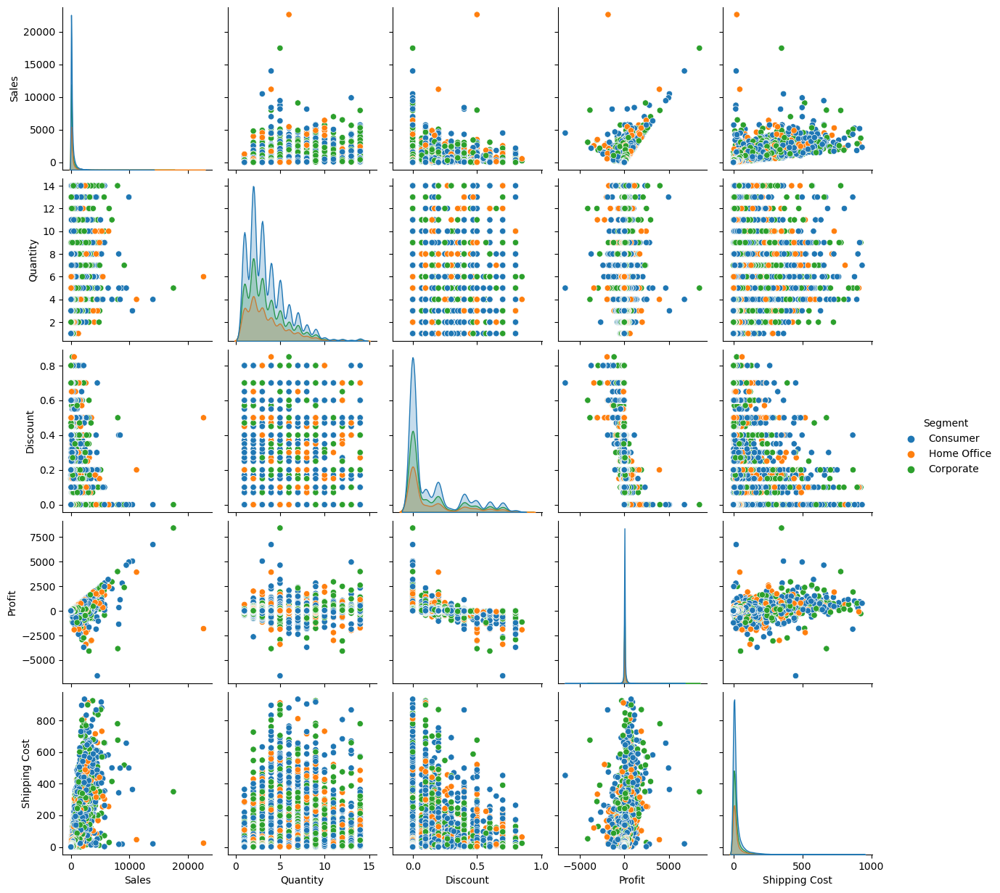

In [7]:
sns.pairplot(
    df[['Segment',
        'Sales',
        'Quantity',
        'Discount',
        'Profit',
        'Shipping Cost',
       ]],
    hue='Segment',
)

Uma análise atenta destes gráficos permitem a identificação de uma série de caracteríticas dos dados, aprofundando a visão do analista e aumentando a quantidade de *insights* da análise. Abaixo estão listadas algumas destas percepções:

* Gráfico 1x2: O valor das vendas é majoritariamente abaixo de US\$ 5.000,00
* Gráfico 1x3: Descontos variam de 0 a 80%, com ocorrêcia relevante de vendas sem desconto
* Gráfico 1x4: O lucro encontrata-se predominantemente na faixa dos 0 a US\$ 1.000,00 Mas existe uma ocorrência importante de transações com lucro negativo (prejuízo)
* Gráfico 4x3: O lucro possui correlação negativa com o desconto
* Gráfico 5x5: O custo de entrega encontra-se predominantemente na faixa dos 0 a US\$ 250,00
* Gráfico 2x5: A quantidade de itens não parece possuir alta correlação com o custo de entrega
* Gráfico 4x3: Produtos com menor desconto tendem a ter maior lucro. Acima de 20% de desconto temos uma prevalência de lucro pequeno, zerado e negativos

#### Distplot

* Adicionalmente, também foram gerados gráficos individuais de distribuição para cada um dos atributudos numéricos do conjunto de dados:

**Sales**

<Axes: xlabel='Sales', ylabel='Count'>

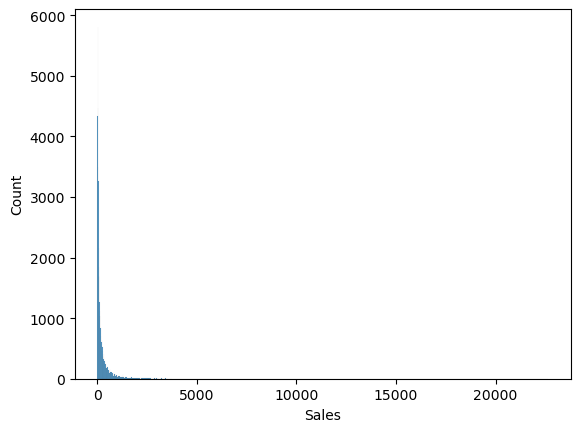

In [8]:
sns.histplot(df['Sales'])

**Profit**

<Axes: xlabel='Profit', ylabel='Density'>

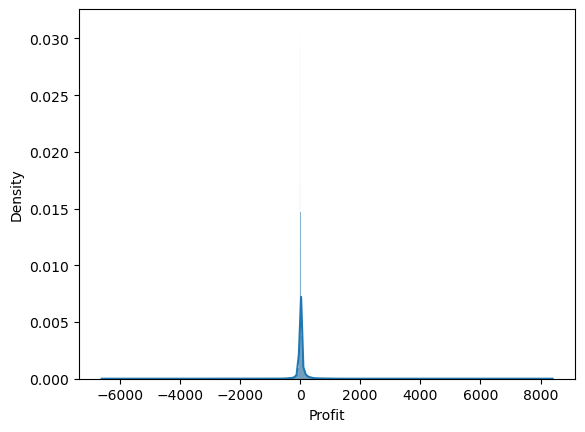

In [9]:
sns.histplot(df['Profit'], kde=True, stat="density")

**Discount**

<Axes: xlabel='Discount', ylabel='Density'>

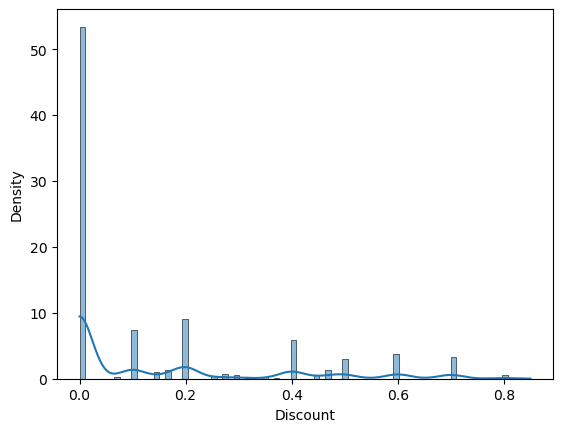

In [10]:
sns.histplot(df['Discount'], kde=True, stat="density")

**Shipping Cost**

<Axes: xlabel='Shipping Cost', ylabel='Density'>

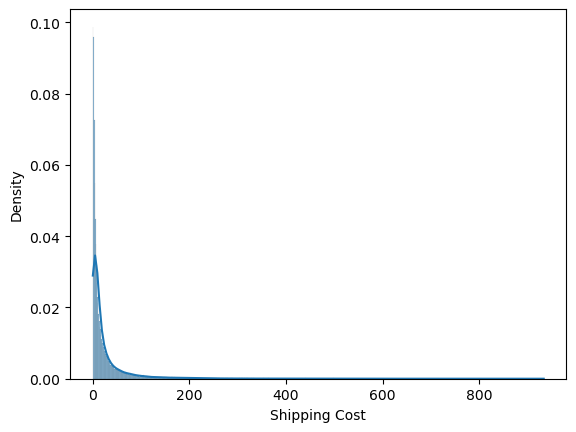

In [11]:
sns.histplot(df['Shipping Cost'], kde=True, stat="density")

**Quantity**

<Axes: xlabel='Quantity', ylabel='Density'>

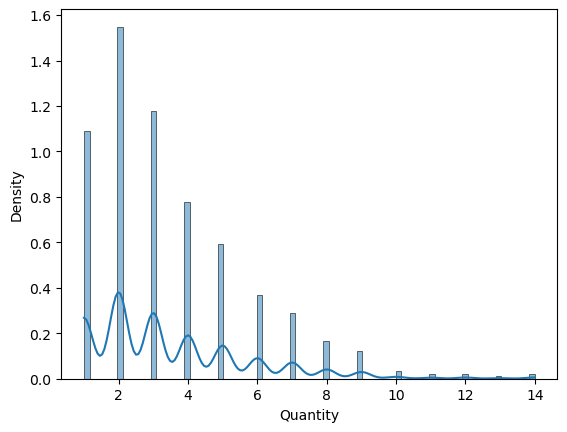

In [12]:
sns.histplot(df['Quantity'], kde=True, stat="density")

### Produtos Mais vendidos

#### Por Valor

In [13]:
top = df[['Product Name', 'Sales', 'Quantity', 'Order ID']]
top = top.groupby('Product Name').agg(
    {
        'Quantity':'sum',
        'Sales':'sum',
        'Order ID':'count',
    }
).sort_values('Sales', ascending=False).reset_index()

top.rename(index=str, 
          columns={'Order ID':'Orders'},
          inplace=True)

top10 = top[0:10]
other = top[10:]

new_line = {
    'Product Name': 'Other',
    'Quantity':other['Quantity'].sum(),
    'Sales':other['Sales'].sum(),
    'Orders':other['Orders'].sum(),
}

top = pd.concat([top10, pd.DataFrame([new_line])]).reset_index(drop=True)

all = top['Sales'].sum()
top['dist'] = top['Sales'].apply(
    lambda x: (x/all)
    )
top['dist'] = (top['dist']*100).map('{:.2f}%'.format)

In [14]:
top.style.format(
    {
        'Sales': lambda x: locale.currency(x,grouping=True)
    }
)

,Product Name,Quantity,Sales,Orders,dist
0,"Apple Smart Phone, Full Size",171,"$86,935.78",51,0.69%
1,"Cisco Smart Phone, Full Size",139,"$76,441.53",38,0.60%
2,"Motorola Smart Phone, Full Size",134,"$73,156.30",38,0.58%
3,"Nokia Smart Phone, Full Size",147,"$71,904.56",47,0.57%
4,Canon imageCLASS 2200 Advanced Copier,20,"$61,599.82",5,0.49%
5,"Hon Executive Leather Armchair, Adjustable",169,"$58,193.48",49,0.46%
6,"Office Star Executive Leather Armchair, Adjustable",141,"$50,661.68",45,0.40%
7,"Harbour Creations Executive Leather Armchair, Adjustable",142,"$50,121.52",39,0.40%
8,"Samsung Smart Phone, Cordless",108,"$48,653.46",26,0.38%
9,"Nokia Smart Phone, with Caller ID",96,"$47,877.79",24,0.38%


#### Por Região Geográfica

In [15]:
top = df[['Country', 'Sales', 'Quantity', 'Order ID']]
top = top.groupby('Country').agg(
    {
        'Quantity':'sum',
        'Sales':'sum',
        'Order ID':'count',
    }
).sort_values('Sales', ascending=False).reset_index()

top.rename(index=str, 
          columns={'Order ID':'Orders'},
          inplace=True)

top10 = top[0:10]
other = top[10:]

new_line = {
    'Country': 'Other',
    'Quantity':other['Quantity'].sum(),
    'Sales':other['Sales'].sum(),
    'Orders':other['Orders'].sum(),
}

top = pd.concat([top10, pd.DataFrame([new_line])]).reset_index(drop=True)

all = top['Sales'].sum()
top['dist'] = top['Sales'].apply(
    lambda x: (x/all)
    )
top['dist'] = (top['dist']*100).map('{:.2f}%'.format)

In [16]:

pd.options.display.float_format = '{:.2f}'.format
top.style.format(
    {
        'Sales': lambda x: locale.currency(x,grouping=True)
    }
)

,Country,Quantity,Sales,Orders,dist
0,United States,37873,"$2,297,200.86",9994,18.17%
1,Australia,10673,"$925,235.85",2837,7.32%
2,France,10804,"$858,931.08",2827,6.79%
3,China,7081,"$700,562.03",1880,5.54%
4,Germany,7745,"$628,840.03",2065,4.97%
5,Mexico,10011,"$622,590.62",2644,4.92%
6,India,5758,"$589,650.10",1555,4.66%
7,United Kingdom,6161,"$528,576.30",1633,4.18%
8,Indonesia,5237,"$404,887.50",1390,3.20%
9,Brazil,6148,"$361,106.42",1599,2.86%


In [17]:
country = px.data.gapminder()
country = country[['country','continent', 'iso_alpha']].drop_duplicates().reset_index(drop=True)
country.rename(index=str, 
          columns={'country':'Country'},
          inplace=True)

In [18]:
top_map = top[:-1].merge(
    country,
    on='Country',
    how='left',
)

In [19]:
top_map

,Country,Quantity,Sales,Orders,dist,continent,iso_alpha
0,United States,37873,2297200.86,9994,18.17%,Americas,USA
1,Australia,10673,925235.85,2837,7.32%,Oceania,AUS
2,France,10804,858931.08,2827,6.79%,Europe,FRA
3,China,7081,700562.03,1880,5.54%,Asia,CHN
4,Germany,7745,628840.03,2065,4.97%,Europe,DEU
5,Mexico,10011,622590.62,2644,4.92%,Americas,MEX
6,India,5758,589650.10,1555,4.66%,Asia,IND
7,United Kingdom,6161,528576.30,1633,4.18%,Europe,GBR
8,Indonesia,5237,404887.50,1390,3.20%,Asia,IDN
9,Brazil,6148,361106.42,1599,2.86%,Americas,BRA


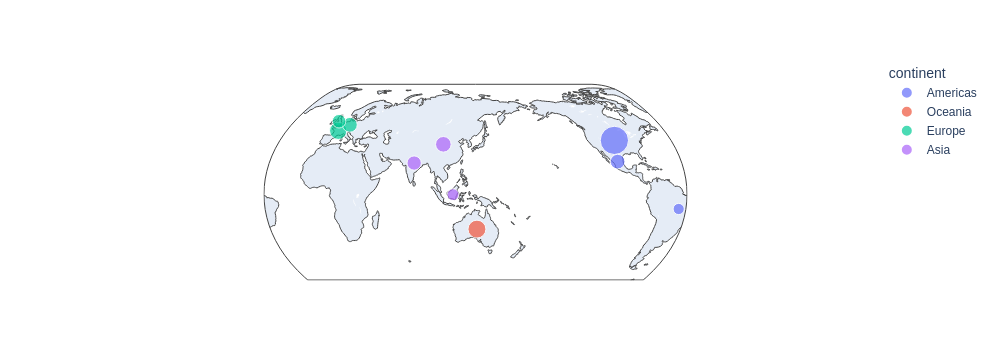

In [20]:
fig = px.scatter_geo(
    top_map,
    locations="iso_alpha",
    color="continent",
    hover_name="Country",
    size="Sales",
    projection="natural earth"
)
fig.show()

## Análise de relações entre vendas e outras variáveis

### Vendas vs Preço do Produto

In [21]:
# Calculo do preço unitário do produto
df['unit_price'] = df.apply(
    lambda x: x['Sales']/x['Quantity']
    ,axis=1
)

In [22]:
# Cálculo da Correlação
df['Sales'].corr(df['unit_price'])

0.8090843384506388

<Axes: xlabel='unit_price', ylabel='Sales'>

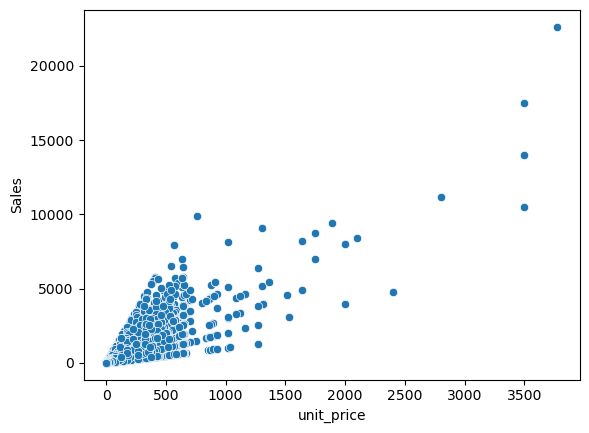

In [23]:
# Visualização
sns.scatterplot(data=df, x='unit_price', y='Sales')

* Observa-se no conjunto de dados que Valor da venda e valor unitário do produto **possuem uma alta correlação**, na ordem de 0.8
* Tal correlação pode ser facilmente observada no gráfico, onde é clara a tendência de aumento do valor da venda quando há aumento do valor unitário do produto

### Vendas vs Tempo de Entrega

In [24]:
# Calculo do tempo de entrega em dias
df['days_to_ship'] = df.apply(
    lambda x: (x['Ship Date'] - x['Order Date']).days
    ,axis=1
)

In [25]:
# Cálculo da Correlação
df['Sales'].corr(df['days_to_ship'])

-0.004659709218983873

<Axes: xlabel='days_to_ship', ylabel='Sales'>

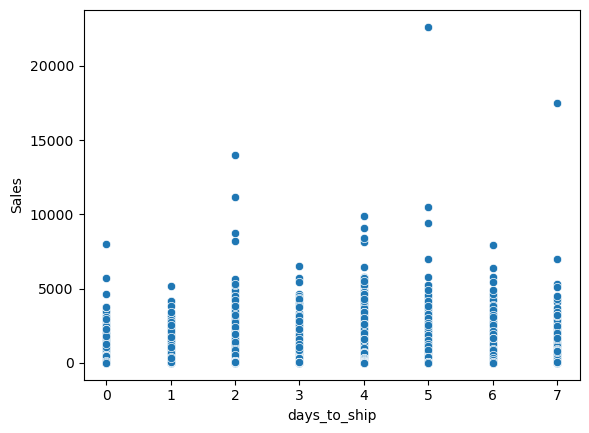

In [26]:
# Visualização
sns.scatterplot(data=df, x='days_to_ship', y='Sales')

* Observa-se no conjunto de dados que Valor da venda e tempo de entrega em dias **possuem uma baixa correlação negativa**, na ordem de 0.004
* Desta forma, observamos que o tempo de entrega não possui influência no valor da venda, como pode ser observado no gráfico

# Etapas "Desafio"

## Extração do Dataset diretamente do repositório Git Hub

* Este desavio já foi atendido na etapa de **Extração dos dados**, onde temos a leitura do CSV sendo feita diretamente no URL do arquivo no repositório

## Armazenar o dataset em banco de dados SQLite

In [27]:
# Conecta ao banco
conn = sqlite3.connect('data/sales.db')

# Escreve o dataframe final na tabela 'orders'
df.to_sql('orders', conn, if_exists='replace', index=False)

51290

In [28]:
# Realiza consulta de teste
query = """
SELECT
    Country
    ,sum(Sales) AS Sales
FROM orders
GROUP by Country
order by sum(Sales) desc
LIMIT 5
"""
top5 = pd.read_sql(query, conn)

In [29]:
top5

,Country,Sales
0,United States,2297200.86
1,Australia,925235.85
2,France,858931.08
3,China,700562.03
4,Germany,628840.03


## Previsão de vendas utilizando ténicas de Machine Learning

Nesta Seção será implementado um modelo supervisionado de aprendizado de máquina do tipo **MLP Regression**.
* Após implementação, treinamento e execução do modelo, os resultados das previsões serão comparados com os resultados reais
* Além disso, serão apresentadas as métricas MSE, MSA e R2 para o modelo
* Por fim é apresentado um gráfico comparando as vendas reais com as vendas previstas pelo modelo, bem como uma previsão para anos futuros que não fazem parte do dataset original

In [31]:
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Obtenção dos dados
conn = sqlite3.connect('data/sales.db')
query = """
SELECT
    "Order Date" as date
    ,sum(Sales) as sales
FROM orders
GROUP BY Sales
ORDER BY "Order Date" ASC
"""
df = pd.read_sql(query, conn)

# pré-processamento
df['date'] = pd.to_datetime(df['date'])
df['year'] = df['date'].apply(lambda x: x.year)
df = df[['year','sales']].groupby('year').agg({'sales':'sum'}).reset_index()

# modelo
x = df[['year']]
y = df['sales']
modelo = MLPRegressor(hidden_layer_sizes=(1000, ), max_iter=100000, random_state=42)

# treinamento do modelo
modelo.fit(x, y)

# avaliação do modelo
y_pred = modelo.predict(x)

mse = mean_squared_error(y, y_pred)
mae = mean_absolute_error(y, y_pred)
r2 = r2_score(y, y_pred)

In [32]:
# Métricas do modelo
print(f'MSE: {mse}')
print(f'MAE: {mae}')
print(f'R-squared: {r2}')

MSE: 96212401035.16434
MAE: 286231.0253742265
R-squared: 0.010485847966258843


In [33]:
# Novas Previsões
x_new = pd.DataFrame([2015,2016,2017,2018], columns=['year'])
y_new = modelo.predict(x_new)
df_new = x_new.copy()
df_new['sales'] = y_new

# Dataframe com todas as previsões
df_pred = df[['year']].copy()
df_pred['sales'] = y_pred
df_pred = pd.concat([df_pred, df_new])

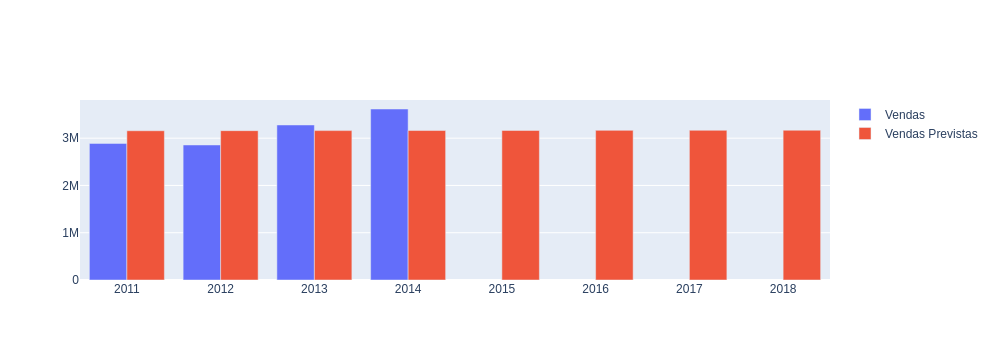

In [34]:
# Gráfico com os resultados
years=[2011,2012,2013,2014]

fig = go.Figure(data=[
    go.Bar(name='Vendas', x=df['year'], y=df['sales']),
    go.Bar(name='Vendas Previstas', x=df_pred['year'], y=df_pred['sales'])
])
# Change the bar mode
fig.update_layout(barmode='group')
fig.show()

## Gravação do modelo em um arquivo Pickle para utilização futura

In [35]:
import pickle
from sklearn.linear_model import LinearRegression

nome_do_arquivo = './data/model.pkl'

with open(nome_do_arquivo, 'wb') as arquivo:
    pickle.dump(modelo, arquivo)

## Dashboard Interativo

![Dashboard](data/dashboard.gif "segment")

* Para concluir o desafio foi desenvolvido um Dashboard simples utilizando a tecnologia [Dash Plotly](https://dash.plotly.com/), uma ferramenta totalmente open-source
* Foi disponibilizada uma versão online no endereço [https://fadesp.andrepereira.eng.br](https://fadesp.andrepereira.eng.br)
* O código fonte da aplicação é parte integrante deste repositório
* Neste exemplo foram implementadas as seguintes funcionalidades:
    * Gráfico de vendas por mês e segmento de negócio
    * Gráfico de pizza por mercado
    * Filtros de segmentos de negócio a serem considerados
    * Filtro de período da consulta
    * Botão de download do dataset gerado pelos filtros